# Aula 6 - Algoritmos Não-Supervisionados e k-means

Na aula de hoje, vamos explorar os seguintes tópicos em Python:

- 1) Algoritmos não-supervisionados
- 2) K-means
- 3) Exemplo real

____
____
_____

## 1) Algoritmos não-supervisionados

Um dos problemas que podem ser resolvidos com Machine Learning é o da __clusterização__!

Este tipo de problema consiste em __agrupar__ itens semelhantes, isto é, criar __grupos__ (ou __clusters__) dos dados que são parecidos entre si.

> O objetivo central é **dividir os dados em grupos distintos**, tais que **membros de cada grupo sejam similares entre si**

Problemas como estes podem aparecer em diversos contextos:

- Identificação de tipos de clientes parecidos, para o direcionamento de marketing;
- Agrupamento de cidades próximas para melhor logística de entrega de produtos;
- Identificação de padrões climáticos;
- Identificação de genes relacionados à determinada doença;
- Identificação de documentos semelhantes em processos legais;

...e qualquer outro problema em que você deseje **AGRUPAR DADOS SIMILARES** ou ainda **ENCONTRAR ALGUMA ESTRUTURA NOS SEUS DADOS!**

Veremos agora um dos principais algoritmos de clusterização, o **k-means**



In [2]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

___
___
___

## 2) K-means

Documentação: [clique aqui!](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html#sklearn.cluster.KMeans)

O k-means é utilizado para a determinação de um número **k de clusters em nossos dados** (na parte 2.3 explicamos melhor como este algoritmo funciona!)

O primeiro passo pra aplicar o k-means é:

- Determinar o número k de clusters!

Por exemplo, só de olhar pros dados plotados a seguir, fica fácil de identificar 4 grupos distintos, não é mesmo? 


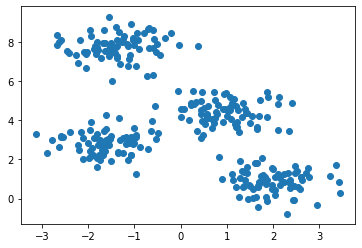

In [2]:
# geracao dos dados
from sklearn.datasets import make_blobs

X, y = make_blobs(n_samples=300, centers=4, cluster_std=0.60, random_state=0)

plt.scatter(X[:,0], X[:,1])

In [3]:
# dando uma olhada em X

X

array([[ 8.36856841e-01,  2.13635938e+00],
       [-1.41365810e+00,  7.40962324e+00],
       [ 1.15521298e+00,  5.09961887e+00],
       [-1.01861632e+00,  7.81491465e+00],
       [ 1.27135141e+00,  1.89254207e+00],
       [ 3.43761754e+00,  2.61654166e-01],
       [-1.80822253e+00,  1.59701749e+00],
       [ 1.41372442e+00,  4.38117707e+00],
       [-2.04932168e-01,  8.43209665e+00],
       [-7.11099611e-01,  8.66043846e+00],
       [-1.71237268e+00,  2.77780226e+00],
       [-2.67000792e+00,  8.35389140e+00],
       [ 1.24258802e+00,  4.50399192e+00],
       [-2.22783649e+00,  6.89479938e+00],
       [ 1.45513831e+00, -2.91989981e-02],
       [ 4.53791789e-01,  3.95647753e+00],
       [ 1.06923853e+00,  4.53068484e+00],
       [ 2.56936589e+00,  5.07048304e-01],
       [-1.06690610e+00,  3.13165795e+00],
       [-1.07859101e+00,  2.20451529e+00],
       [ 2.71506328e+00,  1.29082190e+00],
       [ 1.77710994e+00,  1.18655254e+00],
       [ 7.34363910e-01,  5.03725437e+00],
       [-1.


Mas, como o computador pode identificar estes grupos? É isso que o algoritmo responde!

Uma vez determinado o número k de clusters, podemos construir nosso modelo!

Primeiramente, lemos nossos dados e os armazenamos na variável X. Para os dados acima, usamos um dataset do próprio sklearn:

### 2.1) Construindo o modelo

Note que temos apenas as **features** dos dados (no caso, coordenadas x e y). Iso caracteriza um problema de clusterização **não-supervisionado**: quando nossos dados **não têm targets**, apenas features!

In [3]:
# 1) - importando a classe Kmeans do sklearn

from sklearn.cluster import KMeans

Temos vários argumentos na classe, mas os principais são:

- n_clusters: quantos clusters queremos (o número k);
- max_iter: é o número máximos de iterações que o algoritmo fará, se ele não convergir antes disso. É uma boa ideia não colocar um número tão grande, ou o algoritmo pode ficar bem lento. Algo da ordem de 1000, em geral é uma boa escolha.

Por fim, pra fitar o modelo, fazemos:

In [5]:
# 2) instanciando o modelo
# use k = 4

estimador = KMeans(n_clusters=4, max_iter=1000)

print("parâmetros:", estimador.get_params())

parâmetros: {'algorithm': 'auto', 'copy_x': True, 'init': 'k-means++', 'max_iter': 1000, 'n_clusters': 4, 'n_init': 10, 'n_jobs': None, 'precompute_distances': 'auto', 'random_state': None, 'tol': 0.0001, 'verbose': 0}


Em algoritmos **não supervisionados**, não existe a divisão em dados de treino e dados de teste, porque **não há o que testar!**. Queremos apenas **econtrar estrutura** nos dados!

Então, basta fitar o modelo com nossos dados todos (no caso, o array X)

In [6]:
# 3) e 4) treinando o modelo

modelo = estimador.fit(X)

Agora que o modelo está treinado, podemos fazer predições:


In [7]:
# 5) fazendo previsões

clusters = modelo.predict(X)

Isto retorna uma lista com número de elementos igual ao número de pontos do dataset, e com valores entre 0 e k-1, indicando qual é o número do cluster (a contagem começa com zero). 

No nosso caso, como k = 4, teremos os clusters 0, 1, 2 e 3.

Pra visualizarmos os clusters, podemos fazer:

Bem legal, não é mesmo? :)


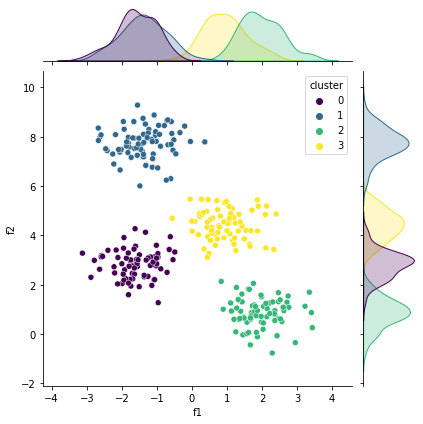

In [8]:
#aqui eu crio um dataframe com as coordenadas dos pontos ("x" e "y"), e com as labels dos clusters
clustered_data = pd.concat([pd.DataFrame(X), pd.Series(clusters)], axis=1)

#aqui eu renomeio as colunas do dataframe
clustered_data.columns = ['f1','f2','cluster']

#aqui eu faço o plot
sns.jointplot(data = clustered_data, x="f1", y="f2", hue="cluster", palette="viridis")

_____

In [13]:
df_final[df_final["cluster"]==4]

,f1,f2,f3,f4,cluster
0,8.197651,5.260391,-0.735653,5.849069,4
4,10.115577,5.931147,-2.408136,5.647790,4
9,10.507935,5.660226,-1.720548,3.476369,4
15,9.768431,5.651059,1.421117,3.468123,4
21,8.481499,7.270329,-2.544598,5.582153,4
...,...,...,...,...,...
484,10.481244,5.594784,-2.203312,5.578669,4
489,9.929408,5.198465,0.151105,6.160248,4
493,8.302403,5.216717,-3.603024,4.792038,4
495,8.485754,4.758450,-0.904589,4.243776,4


### **2.2) - Determinando o k**

Mas e se não for tão fácil de plotar os dados para determinar o k?

Pode ser que não consigamos visualizar nossos dados em 2D, se, por exemplo, tivermos mais de 3 features em nossos dados...

Neste caso, podemos usar o __método do cotovelo__, que consiste em rodar o k-means várias vezes, para diferentes valores de k, e depois plotar um gráfico com a **inércia** de cada uma das rodadas. 

A inércia também é chamada de **WCSS** (Within-Cluster-Sum-of-Squares), isto é, "soma de quadrados intra-cluster", que é calculada como a soma das distâncias (ao quadrado) entre os pontos e os centróides dos clusters.

Quanto menor o WCSS, mais eficiente foi a clusterização, **mas até certo ponto!**

Conforme o número de clusters (k) aumenta, o WCSS diminui, sendo mínimo quando cada ponto é seu próprio cluster isolado (o que não é nada útil, pois se cada ponto for um cluster, não há clusterização alguma!).

Assim, o que queremos não é encontrar um k que minimize o WCSS, mas sim um k a partir do qual o WCSS **para de decrescer tão rapidamente!**

Quando encontramos este k, encontramos o número ideal de clusters!

Ao plotarmos o WCSS (inércia) em função de k, o que buscaremos será então o valor de k onde **o gráfico deixa de ser tão inclinado**. Esses pontos são visualizados como "quinas", ou **cotovelos** no gráfico -- e daí vem o nome do método!

Para aplicar o método, fazemos:



O valor de k mais adequado é aquele em que o gráfico tem uma "quina" bem abrupta: no exemplo acima, k = 4, como já sabíamos! 





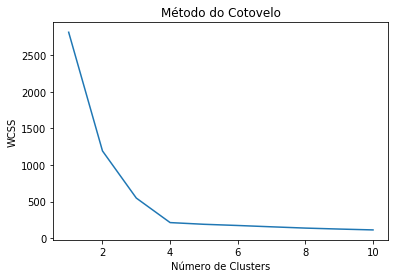

In [9]:
#inicializamos uma lista vazia para armazenar a inercia de cada modelo com um k diferente
#a inercia é a soma dos quadrados das distâncias dos pontos ao cluster mais próximo, e funciona como uma espécie de erro.
inercia = []

#criamos um iterável para os valores de k que vamos testar. Neste caso, testaremos de 1 a 10!
lista_k = range(1, 11)

#aqui vamos fitar o modelo e atualizar nossa lista de inercias
for k in lista_k:
    #aqui fitamos o modelo
    kmeans = KMeans(n_clusters=k).fit(X)
    
    #aqui apendamos a inercia do modelo com o k atual à nossa lista
    #a inerrcia é a propriedade ".inertia_" do modelo!
    inercia.append(kmeans.inertia_)

# Aqui plotamos a inercia em função do k!
plt.plot(range(1, 11), inercia)
plt.title('Método do Cotovelo')
plt.xlabel('Número de Clusters')
#a inercia também é chamada de WCSS
plt.ylabel('WCSS')
plt.show()

___

### Vamos fazer o exemplo com mais features

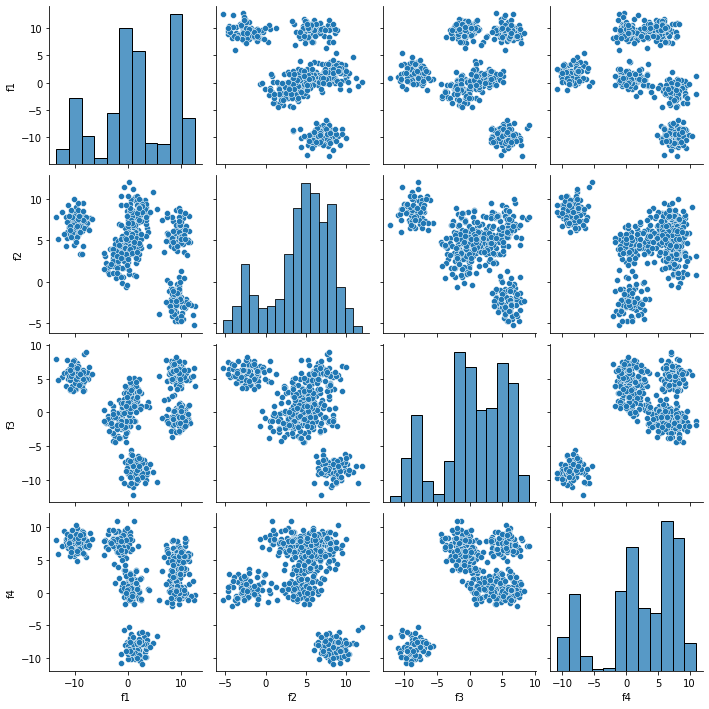

In [4]:
from sklearn.datasets import make_blobs

X, y = make_blobs(n_samples=500, n_features=4, centers=6, cluster_std=1.3, random_state=0)

df = pd.DataFrame(X, columns=["f1", "f2", "f3", "f4"])

sns.pairplot(data=df)

**Aplicando o método do cotovelo...**

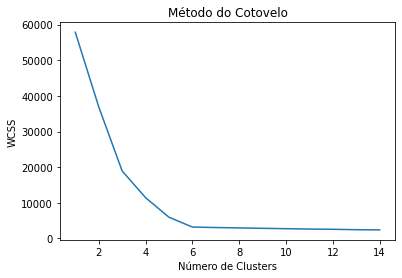

In [11]:
inercia = []

lista_k = range(1, 15)

for k in lista_k:
    
    kmeans = KMeans(n_clusters=k).fit(X)
    
    inercia.append(kmeans.inertia_)

plt.plot(range(1, 15), inercia)
plt.title('Método do Cotovelo')
plt.xlabel('Número de Clusters')
plt.ylabel('WCSS')
plt.show()

**Vamos tentar separadamente $k=3$ e $k=6$**

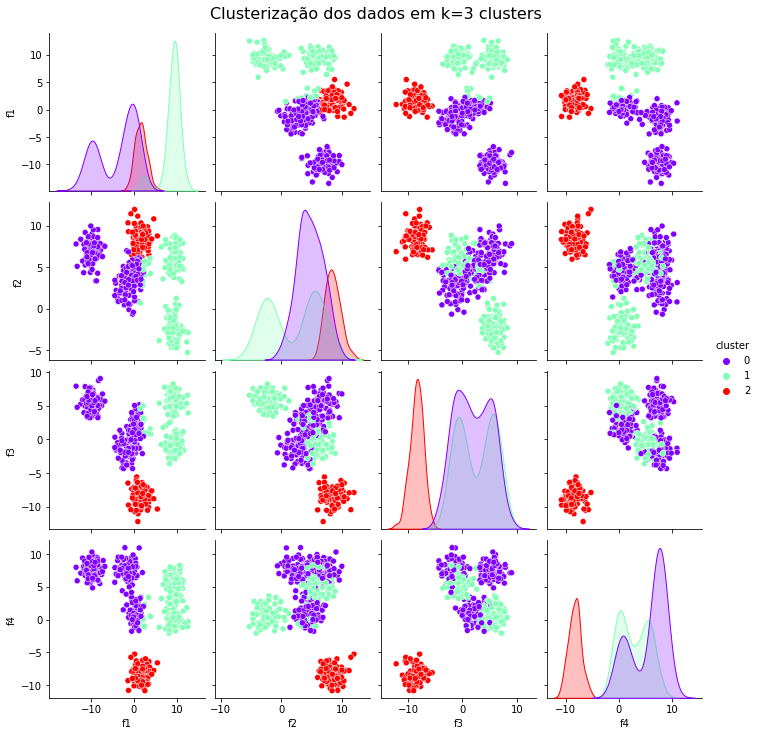

In [6]:
from sklearn.cluster import KMeans

estimador = KMeans(n_clusters=3, max_iter=1000)
modelo = estimador.fit(X)
clusters = modelo.predict(X)

df_final = pd.concat([df, pd.Series(clusters)], axis = 1)
df_final.columns = df.columns.tolist() + ["cluster"]

g = sns.pairplot(df_final, hue="cluster", palette="rainbow")
g.fig.suptitle("Clusterização dos dados em k=3 clusters", y=1.02, size=16)
plt.show()

In [7]:
df_final

,f1,f2,f3,f4,cluster
0,8.197651,5.260391,-0.735653,5.849069,1
1,1.611614,7.007810,-7.577404,-8.426986,2
2,-0.820599,3.488638,-1.533659,6.426212,0
3,-0.017117,2.434658,3.829159,0.001380,0
4,10.115577,5.931147,-2.408136,5.647790,1
...,...,...,...,...,...
495,8.485754,4.758450,-0.904589,4.243776,1
496,5.483158,8.758282,-10.332216,-6.612936,2
497,10.670861,5.104899,-2.061783,8.265277,1
498,-0.368246,5.189860,1.010835,0.001249,0


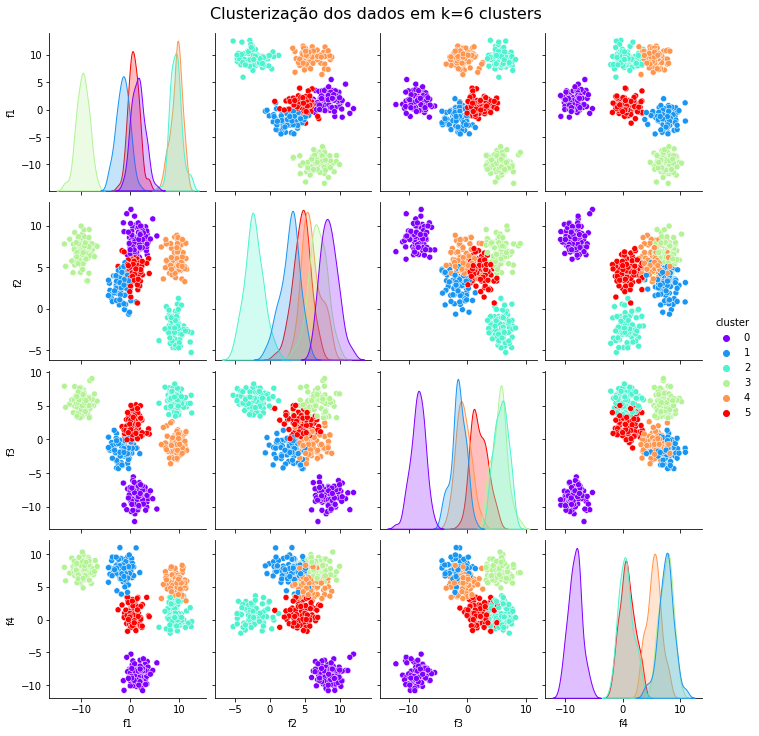

In [8]:
from sklearn.cluster import KMeans

estimador = KMeans(n_clusters=6, max_iter=1000)
modelo = estimador.fit(X)
clusters = modelo.predict(X)

df_final = pd.concat([df, pd.Series(clusters)], axis = 1)
df_final.columns = df.columns.tolist() + ["cluster"]

g = sns.pairplot(df_final, hue="cluster", palette="rainbow")
g.fig.suptitle("Clusterização dos dados em k=6 clusters", y=1.02, size=16)
plt.show()

As projeções em duas dimensões mostram que $k=6$ de fato é a melhor escolha! (O que faz sentido, pois nossos dados artificiais foram preparados para conter 6 clusters!)

____

### **2.3) E como o k-means funciona?**

Uma vez escolhido o número de clusters, o k-means segue as seguintes etapas:

- 1) k pontos são escolhidos aleatoriamente como sendo os centroides dos clusters (centroide é o centro do cluster);

- 2) Para cada ponto, vamos calcular qual é a distância entre ele e os k centroides. Aquele centroide que estiver mais perto, será o cluster ao qual este ponto pertencerá. Fazemos isso para todos os pontos!

- 3) Ao fim do passo 2, teremos k clusters, cada um com seu centroide, e todos os pontos pertencerão a determinado cluster!

- 4) Uma vez que temos os clusters, calculamos qual é de fato o centro de cada um deles. Isso é feito tomando a média da posição de todos os pontos;

- 5) Após determinar os novos k centroides, repetimos o processo!

- 6) E o processo se repete até que os centroides não mudem mais. Quando esta convergência for alcançada (ou após o número determinado de iterações), o algoritmo termina!

<img src="https://stanford.edu/~cpiech/cs221/img/kmeansViz.png" width=700>

<img src="https://miro.medium.com/max/1280/1*rwYaxuY-jeiVXH0fyqC_oA.gif" width=500>

<img src="https://miro.medium.com/max/670/1*JUm9BrH21dEiGpHg76AImw.gif" width=500>

_____

### **2.4) Quando uso algoritmos de clusterização, e em que casos eles não são uma boa ideia?**


De certa fora, algoritmos de clusterização podem ser vistos como classificadores, uma vez que os clusters podem caracterizar um grupo, ou uma classe.

No entanto, há uma diferença bem importante entre problemas de classificação e clusterização:

- **Problemas de classificação** em geral são **supervisionados**, isto é, os dados que utilizamos têm tanto as features como os **targets**. Em outras palavras, neste tipo de problema, sabemos de antemão quais são as classes de interesse!

- **Problemas de clusterização**, por outro lado, são **não-supervisionados**. ou seja, os dados **não têm** targets, temos apenas as features! O nosso objetivo é justamente descobrir **alguma estrutura de agrupamento** nos dados, mas sem qualquer informação prévia quanto aos grupos a serem formados.

Foi exatamente o caso do nosso exemplo: nós tínhamos apenas as **features** dos dados (f1, f2, etc), e **nenhuma** informação quanto aos grupos que seriam formados.

Foi só depois que fizemos a análise exploratória dos dados (plot), que pudemos identificar alguma estrutura (4 clusters), para então aplicar o k-means!

No segundo caso, só pudemos determinar o número de clusters de forma segura utilizando o **método do cotovelo**.

Assim sendo, via de regra, a utilização ou não de algoritmos de clusterização, além do tipo de problema, depende dos **dados disponíveis**:

- Se os dados são previamente classificados (temos **features e targets**), a melhor estratégia é usar **algoritmos de classificação** (regressão logística, árvores, SVM, etc.);

- Mas, se os dados não são previamente classificados (temos **apenas as features**), a melhor estratégia é usar **algoritmos de clusterização** (k-means, [DBSCAN](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html#sklearn.cluster.DBSCAN), [hierarchical clustering](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html#sklearn.cluster.AgglomerativeClustering), etc.)


____
____
____

## 3) Exemplo real

Vamos agora a um exemplo real de um problema de clusterização onde podemos usar o k-means?

Usaremos [dados sobre faculdades americanas](https://www.kaggle.com/flyingwombat/us-news-and-world-reports-college-data?select=College.csv)

Os dados são referentes ao ano de 1995, e contêm as seguintes variáveis:

- Apps: número de aplicações (inscrições para processo seletivo) recebidas

- Accept: número de aplicações aceitas

- Enroll: número de novos alunos admitidos naquele ano

- Top10perc: porcentagem de novos alunos que vieram das top 10% melhores escolas de ensino médio

- Top25perc: porcentagem de novos alunos que vieram das top 25% melhores escolas de ensino médio

- F.Undergrad: número de alunos de graduação que estudam em período integral

- P.Undergrad: número de alunos de graduação que estudam meio período

- Outstate: valor da anual da faculdade para alunos fora do estado

- Room.Board: custos anuais de aluguel

- Books: gasto estimado com livros

- Personal: gastos pessoais de custo de vida

- PhD: porcentagem do corpo docente com doutorado

- Terminal: porcentagem do corpo docente com o maior grau de escolaridade possível

- S.F.Ratio: razão de número de estudantes/corpo docente

- perc.alumni: porcentagem de ex-alunos que doaram dinheiro para a universidade

- Expend: gastos institucionais com os estudantes

- Grad.Rate: taxa de graduação


Obs.: originalmente, a base é **supervisionada**, com o target "Private" que indica se a faculdade é pública ou privada. Mas, como estamos estudando problemas não-supervisionados, eu modifiquei a base para não conter esta label.


Vamos explorar os dados para ver se encontramos alguma estrutura neles?

In [33]:
# leia os dados
# a base deve estar em '../datasets/college.csv'

df = pd.read_csv('../datasets/college.csv')

In [34]:
# dê uma olhada nas primeiras linhas

df.head()

,Name,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,Abilene Christian University,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60
1,Adelphi University,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56
2,Adrian College,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54
3,Agnes Scott College,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59
4,Alaska Pacific University,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15


In [35]:
# dê uma olhada na estrutura da base

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 777 entries, 0 to 776
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Name         777 non-null    object 
 1   Apps         777 non-null    int64  
 2   Accept       777 non-null    int64  
 3   Enroll       777 non-null    int64  
 4   Top10perc    777 non-null    int64  
 5   Top25perc    777 non-null    int64  
 6   F.Undergrad  777 non-null    int64  
 7   P.Undergrad  777 non-null    int64  
 8   Outstate     777 non-null    int64  
 9   Room.Board   777 non-null    int64  
 10  Books        777 non-null    int64  
 11  Personal     777 non-null    int64  
 12  PhD          777 non-null    int64  
 13  Terminal     777 non-null    int64  
 14  S.F.Ratio    777 non-null    float64
 15  perc.alumni  777 non-null    int64  
 16  Expend       777 non-null    int64  
 17  Grad.Rate    777 non-null    int64  
dtypes: float64(1), int64(16), object(1)
memory usage: 

In [36]:
# algumas estatísticas rápidas?

df.describe()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
count,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.00000
mean,3001.638353,2018.804376,779.972973,27.558559,55.796654,3699.907336,855.298584,10440.669241,4357.526384,549.380952,1340.642214,72.660232,79.702703,14.089704,22.743887,9660.171171,65.46332
std,3870.201484,2451.113971,929.176190,17.640364,19.804778,4850.420531,1522.431887,4023.016484,1096.696416,165.105360,677.071454,16.328155,14.722359,3.958349,12.391801,5221.768440,17.17771
min,81.000000,72.000000,35.000000,1.000000,9.000000,139.000000,1.000000,2340.000000,1780.000000,96.000000,250.000000,8.000000,24.000000,2.500000,0.000000,3186.000000,10.00000
25%,776.000000,604.000000,242.000000,15.000000,41.000000,992.000000,95.000000,7320.000000,3597.000000,470.000000,850.000000,62.000000,71.000000,11.500000,13.000000,6751.000000,53.00000
50%,1558.000000,1110.000000,434.000000,23.000000,54.000000,1707.000000,353.000000,9990.000000,4200.000000,500.000000,1200.000000,75.000000,82.000000,13.600000,21.000000,8377.000000,65.00000
75%,3624.000000,2424.000000,902.000000,35.000000,69.000000,4005.000000,967.000000,12925.000000,5050.000000,600.000000,1700.000000,85.000000,92.000000,16.500000,31.000000,10830.000000,78.00000
max,48094.000000,26330.000000,6392.000000,96.000000,100.000000,31643.000000,21836.000000,21700.000000,8124.000000,2340.000000,6800.000000,103.000000,100.000000,39.800000,64.000000,56233.000000,118.00000


In [37]:
df.columns.tolist()

['Name',
 'Apps',
 'Accept',
 'Enroll',
 'Top10perc',
 'Top25perc',
 'F.Undergrad',
 'P.Undergrad',
 'Outstate',
 'Room.Board',
 'Books',
 'Personal',
 'PhD',
 'Terminal',
 'S.F.Ratio',
 'perc.alumni',
 'Expend',
 'Grad.Rate']

In [38]:
# notou algo de estranho?
# vamos corrigir!

df.loc[df["PhD"] == 103, "PhD"] = 100

In [39]:
df.loc[df['Grad.Rate'] == 118, 'Grad.Rate'] = 18

In [40]:
# confira que as correções foram feitas

df.describe()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
count,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000
mean,3001.638353,2018.804376,779.972973,27.558559,55.796654,3699.907336,855.298584,10440.669241,4357.526384,549.380952,1340.642214,72.656371,79.702703,14.089704,22.743887,9660.171171,65.334620
std,3870.201484,2451.113971,929.176190,17.640364,19.804778,4850.420531,1522.431887,4023.016484,1096.696416,165.105360,677.071454,16.321324,14.722359,3.958349,12.391801,5221.768440,17.158186
min,81.000000,72.000000,35.000000,1.000000,9.000000,139.000000,1.000000,2340.000000,1780.000000,96.000000,250.000000,8.000000,24.000000,2.500000,0.000000,3186.000000,10.000000
25%,776.000000,604.000000,242.000000,15.000000,41.000000,992.000000,95.000000,7320.000000,3597.000000,470.000000,850.000000,62.000000,71.000000,11.500000,13.000000,6751.000000,53.000000
50%,1558.000000,1110.000000,434.000000,23.000000,54.000000,1707.000000,353.000000,9990.000000,4200.000000,500.000000,1200.000000,75.000000,82.000000,13.600000,21.000000,8377.000000,65.000000
75%,3624.000000,2424.000000,902.000000,35.000000,69.000000,4005.000000,967.000000,12925.000000,5050.000000,600.000000,1700.000000,85.000000,92.000000,16.500000,31.000000,10830.000000,78.000000
max,48094.000000,26330.000000,6392.000000,96.000000,100.000000,31643.000000,21836.000000,21700.000000,8124.000000,2340.000000,6800.000000,100.000000,100.000000,39.800000,64.000000,56233.000000,100.000000


Agora é sua vez!

Lembre de tudo o que vimos no primeiro mês de curso, e **explore os dados**!

Fça quantos gráficos você quiser, formule e responda quantas perguntas vc quiser!

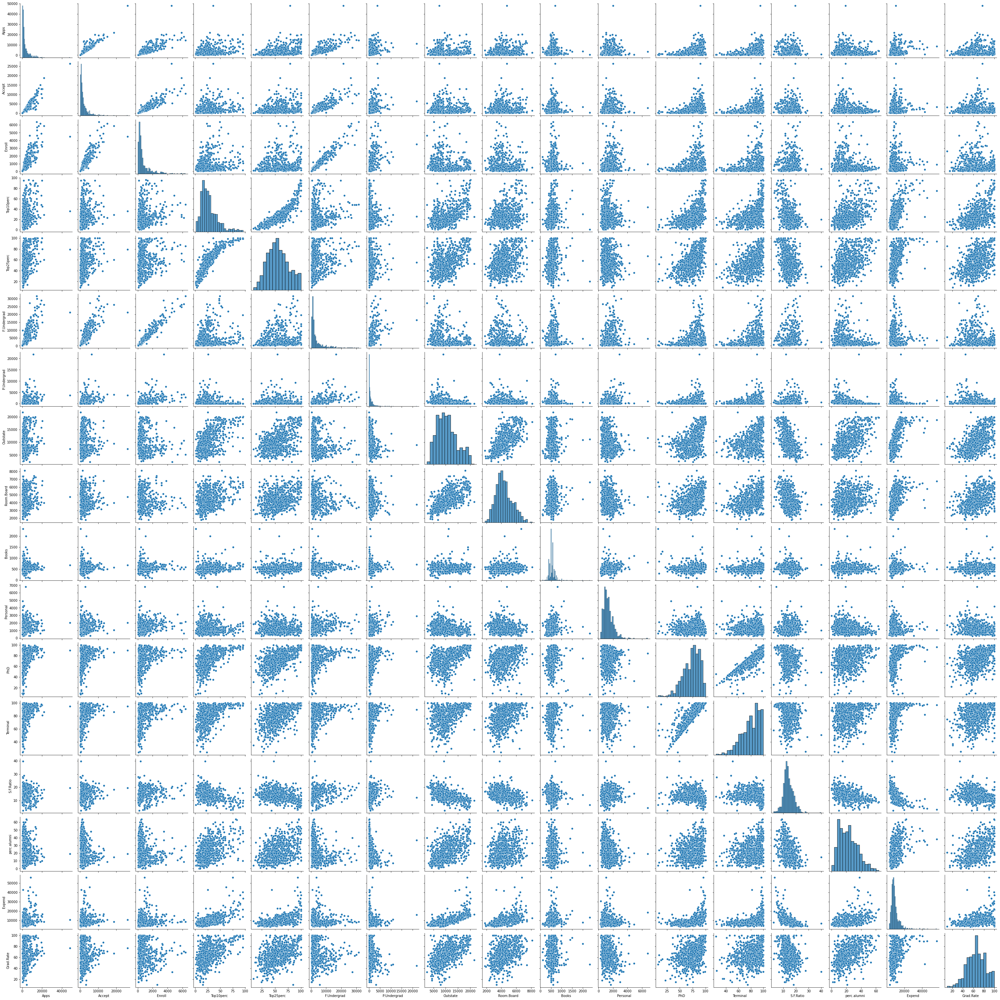

In [41]:
# vamos dar uma olhada no pairplot? (pode ser que demore bastante...)

sns.pairplot(df)

Não é muito óbvio, de imediato, que existem dois grupos distintos, né?

Mas vamos treinar nosso algoritmo para vermos se é possível encontrar alguma estrutura quando todas as features são consideradas juntas!

In [44]:
# treinando o k-means com k=2

from sklearn.cluster import KMeans

X = df.drop(columns="Name")

estimador = KMeans(n_clusters=2, max_iter=1000)
modelo = estimador.fit(X)
clusters = modelo.predict(X)

df_final = pd.concat([df, pd.Series(clusters)], axis = 1)
df_final.columns = df.columns.tolist() + ["cluster"]

Agora que nosso modelo foi criado, será que ganhamos algum novo insight olhando pro pairplot?

In [48]:
df_final[df_final["cluster"]==1]

,Name,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate,cluster
20,Antioch University,713,661,252,25,44,712,23,15476,3336,400,1100,69,82,11.3,35,42926,48,1
21,Appalachian State University,7313,4664,1910,20,63,9940,1035,6806,2540,96,2000,83,96,18.3,14,5854,70,1
23,Arizona State University Main campus,12809,10308,3761,24,49,22593,7585,7434,4850,700,2100,88,93,18.9,5,4602,48,1
27,Auburn University-Main Campus,7548,6791,3070,25,57,16262,1716,6300,3933,600,1908,85,91,16.7,18,6642,69,1
39,Baylor University,6075,5349,2367,34,66,9919,484,6450,3920,600,1346,71,76,18.5,38,7503,72,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
720,Wake Forest University,5661,2392,903,75,88,3499,172,13850,4360,500,1250,95,97,4.3,37,41766,89,1
727,Washington State University,6540,5839,2440,31,70,14445,1344,8200,4210,800,2719,84,87,16.9,30,10912,56,1
728,Washington University,7654,5259,1254,62,93,4879,1274,18350,5775,768,1512,91,98,3.9,31,45702,90,1
743,Western Michigan University,9167,7191,2738,24,53,15739,4278,6940,4100,500,1700,80,84,24.7,11,5983,55,1


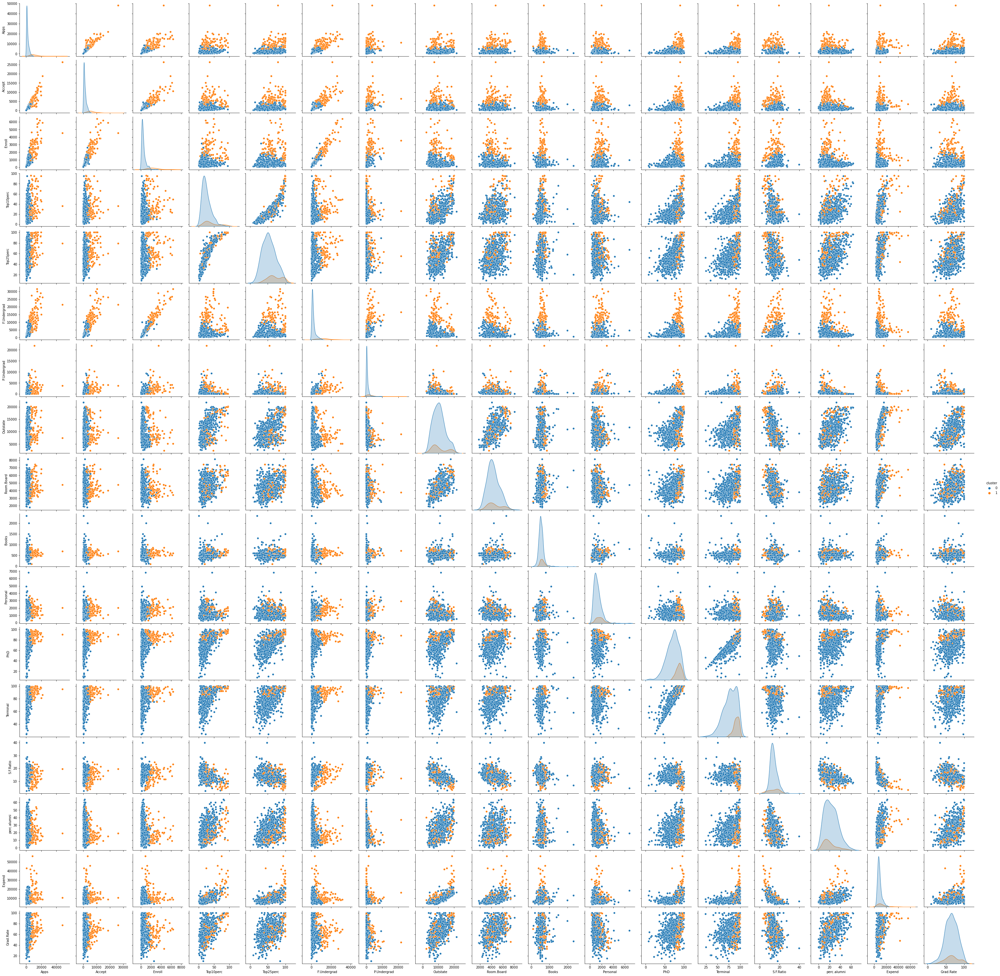

In [45]:
# pair plot com hue
sns.pairplot(df_final, hue="cluster")

____